# Gravity - Part 2

## Tips

Learn `Python` by going through the suggested online tutorials and the `PythonMinimum` notebook.

  * Python tutorials:
     * [A short introduction](https://realpython.com/python-first-steps/)
     * [A more complete introduction](https://www.w3schools.com/python/default.asp)
     * PythonMinimum
  * Use __esc r__ to disable a cell
  * Use __esc y__ to reactivate it
  * Use __esc m__ to go to markdown mode. **Markdown** is the typesetting language used in jupyter notebooks.
  * In a markdown cell, double tap the mouse or glide pad (on your laptop) to go to edit mode. 
  * Shift + return to execute a cell (including markdown cells).
  * If the equations don't typeset, try double tapping the cell again, and re-execute it.


## Goal

This notebook provides a gentle introduction to gravitational interactions.

We use a **heliocentric coordinate system** called the [Solar Ecliptic Coordinate System (SE)](https://omniweb.gsfc.nasa.gov/coho/helios/coor_des.html)
<img src="fig04_heliocentric.png" align="right" alt="heliocentric coordinate system" width="400"/>
The center of this coordinate system is near the center of the Sun. In fact, the origin of this coordinate system is (by [international agreement](https://en.wikipedia.org/wiki/International_Celestial_Reference_System_and_its_realizations)) at the center of mass of the Solar System.
<br clear="right"/>

### Import modules 

In [1]:
import os, sys
import numpy as np
import matplotlib as mp
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# We'll use this to read in the planetary data, which are in CSV files.
import pandas as pd

%matplotlib inline

# update fonts
FONTSIZE = 12
font = {'family' : 'sans-serif',
        'weight' : 'normal',
        'size'   : FONTSIZE}
mp.rc('font', **font)

# use latex if available on system, otherwise set usetex=False
mp.rc('text', usetex=True)

# use JavaScript for rendering animations
mp.rc('animation', html='jshtml')

# set a seed to ensure reproducibility 
# on a given machine
seed = 314159
rnd  = np.random.RandomState(seed)

### Add `CompPhysLab` to Python search path

In [17]:
path = f'{os.environ["HOME"]:s}/CompPhysLab/'
sys.path.append(path)

from computil.newton import magnitude, norm, compute_grav_forces, plot_planet_positions
from computil.graphics import plot_central_axes

### Constants

In [18]:
DAY  = 24*3600.0           # Seconds per Earth day
YEAR = 365.25*DAY          # Seconds per Earth year

Msun = 1.98850e30          # Mass of Sun (kg)
Mmer = 0.33010e24          # Mass of Mercury (kg)
Mven = 4.86730e24          # Mass of Venus (kg)
Mear = 5.97220e24          # Mass of Earth (kg)
Mmar = 0.64169e24          # Mass of Mars (kg)
Mjup = 1898.13e24          # Mass of Jupiter (kg)
AU   = 1.495979e+11        # Astronomical unit (m)
G    = 6.674080e-11        # Gravitational constant (m^3 /kg /s^2)

h    = DAY/2               # Time increment in seconds (1/2 a day)

DEG2RAD  = np.pi / 180     # convert angles to radians


class Bag:                 # a very simple class (see PythonMinimum)
    pass
bag   = Bag()
bag.h = h

### Read in planetary position data

We use the `pandas` module to read the planetary data which are in CSV files. `pandas` is an excellent module for reading and manipulating tables of data.

In [19]:
n = 4 # number of inner planets

planets1 = pd.read_csv('planets-10-22-24.csv')[:n]
planets1['longitude'] *= DEG2RAD
planets1

,planet,longitude,radius,speed
0,1,2.657525,0.351328,4.86195
1,2,4.396137,0.725718,1.59162
2,3,0.000000,1.003587,0.98562
3,4,1.026861,1.491786,0.54435


In [20]:
planets2 = pd.read_csv('planets-10-23-24.csv')[:n]
planets2['longitude'] *= DEG2RAD
planets2

,planet,longitude,radius,speed
0,1,2.741043,0.356983,4.70912
1,2,4.423912,0.725835,1.59110
2,3,0.017202,1.003313,0.98562
3,4,1.036354,1.493081,0.54341


#### Extract to numpy arrays

In [21]:
phi1    = planets1['longitude'].to_numpy()
radius1 = planets1['radius'].to_numpy()

phi2    = planets2['longitude'].to_numpy()
radius2 = planets2['radius'].to_numpy()

#### Compute $(x, y, z)$ coordinates of planets

In [22]:
x = radius1 * np.cos(phi1)
y = radius1 * np.sin(phi1)
z = np.zeros(len(x))

# insert coordinates of the Sun. for simplicity assume that on 2024-09-22, the Sun 
# is at the barycenter of the solar system.
x = np.insert(x, 0, 0)
y = np.insert(y, 0, 0)
z = np.insert(z, 0, 0)
r1= np.array([x, y, z]).T

colors = ['gold', 'magenta', 'orange', 'blue',  'red']
text   = ['Sun',  'Mercury', 'Venus',  'Earth', 'Mars']

x, y

(array([ 0.        , -0.31096328, -0.2257028 ,  1.003587  ,  0.7720094 ]),
 array([ 0.        ,  0.16350184, -0.68972769,  0.        ,  1.27648962]))

### Plot positions of planets

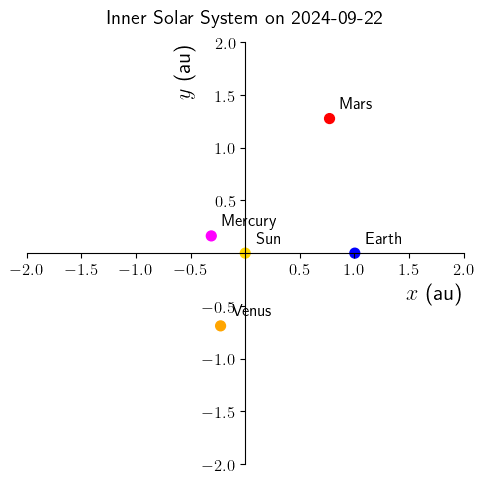

In [23]:
plot_planet_positions(x, y, colors, text)

### Compute velocities of inner planets

In [24]:
# 1. compute positions of planets a day later
x2  = radius2 * np.cos(phi2)
y2  = radius2 * np.sin(phi2)
z2  = np.zeros(len(x2))

# insert coordinates of the Sun. for simplicity assume that on 2024-09-22, the Sun 
# is at the barycenter of the solar system.
x2 = np.insert(x2, 0, 0)
y2 = np.insert(y2, 0, 0)
z2 = np.insert(z2, 0, 0)
r2 = np.array([x2, y2, z2]).T

r2.shape, r2

((5, 3),
 array([[ 0.        ,  0.        ,  0.        ],
        [-0.3287266 ,  0.13919658,  0.        ],
        [-0.20649479, -0.69584219,  0.        ],
        [ 1.00316445,  0.01725845,  0.        ],
        [ 0.76051766,  1.28487523,  0.        ]]))

In [25]:
# 2. compute unit vectors in directions of motion of planets
# for the zero length vectors, return a zero vector.
r = r2 - r1
u = norm(r)
u.shape, u

((5, 3),
 array([[ 0.        ,  0.        ,  0.        ],
        [-0.59005517, -0.80736293,  0.        ],
        [ 0.95288476, -0.30333255,  0.        ],
        [-0.02447611,  0.99970042,  0.        ],
        [-0.80779962,  0.58945718,  0.        ]]))

In [26]:
# 3. compute velocities of the planets
#    convert speed to m / s

speed = magnitude(r) * AU / DAY   # speed in m / s

radius= np.insert(radius1, 0, 0)

speed, radius

(array([    0.        , 52124.64734915, 34902.27587638, 29891.22639182,
        24631.68285515]),
 array([0.       , 0.3513275, 0.7257176, 1.003587 , 1.4917856]))

In [27]:
# cache planetary data in bag

bag.m = np.array([Msun, Mmer, Mven, Mear, Mmar])

# convert positions from au to meters
bag.r = AU * r1
print(bag.r.shape)

# (see explanation of broadcasting below)
bag.v = speed[:, np.newaxis] * u

bag.m.shape, bag.m, bag.r.shape, bag.r, bag.v.shape, bag.v

(5, 3)


((5,),
 array([1.9885e+30, 3.3010e+23, 4.8673e+24, 5.9722e+24, 6.4169e+23]),
 (5, 3),
 array([[ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [-4.65194538e+10,  2.44595312e+10,  0.00000000e+00],
        [-3.37646653e+10, -1.03181813e+11,  0.00000000e+00],
        [ 1.50134508e+11,  0.00000000e+00,  0.00000000e+00],
        [ 1.15490985e+11,  1.90960167e+11,  0.00000000e+00]]),
 (5, 3),
 array([[     0.        ,      0.        ,      0.        ],
        [-30756.41759158, -42083.50791232,      0.        ],
        [ 33257.84678516, -10586.99620127,      0.        ],
        [  -731.62086099,  29882.27143513,      0.        ],
        [-19897.46415419,  14519.32231578,      0.        ]]))

## Numerical Solution of Newton's Second Law

Newton's second law of motion for a particle of mass $m$

$$\vec{F} = m \vec{a},$$ 

can be written as the two 1st-order ordinary differential equations

\begin{align}
    \frac{d\vec{r}}{dt} & = \vec{v}, \\
    \frac{d\vec{v}}{dt} & = \frac{1}{m} \vec{F} .
\end{align}

The equations 
\begin{align}
    \vec{r}(t + h) 
& = \vec{r}(t) + \vec{v}(t) \, h  + \frac{1}{2} \frac{\vec{F}(t)}{m}  \, h^2 +  {\cal O}(h^3),\\
\vec{v}(t + h) & = \vec{v}(t) + \frac{\vec{F}(t)}{m}  \, h + {\cal O}(h^2) ,
\end{align}
that were used to get an approximate solution for the projectile problem are not accurate enough for our purposes. 

### ${\cal O}(h^4)$ Propagation Equation
A more precise equation for propagating positions can be derived from the Taylor series

\begin{align}
    \vec{r}(t + h) 
& = \vec{r}(t) + \vec{r}^{(1)}(t) \, h  + \frac{1}{2} \vec{r}^{(2)}(t)  \, h^2 + \frac{1}{6} \vec{r}^{(3)}(t)  \, h^3 + \frac{1}{24}\vec{r}^{(4)}(t)  \, h^4 +
{\cal O}(h^5),
\end{align}

by making the replacing $h \rightarrow -h$,

\begin{align}
    \vec{r}(t - h) 
& = \vec{r}(t) - \vec{r}^{(1)}(t) \, h  + \frac{1}{2} \vec{r}^{(2)}(t)  \, h^2 - \frac{1}{6} \vec{r}^{(3)}(t)  \, h^3 + \frac{1}{24}\vec{r}^{(4)}(t)  \, h^4 -
{\cal O}(h^5),
\end{align}

and then adding, which, noting that $\vec{r}^{(2)}(t) \equiv \vec{a}(t) = \vec{F}(t) \, / \, m$, yields,

\begin{align}
    \vec{r}(t + h) + \vec{r}(t - h) 
& = 2 \vec{r}(t)  + \frac{\vec{F}(t)}{m}  \, h^2 + \frac{1}{12}\frac{\vec{F}^{(2)}(t)}{m}  \, h^4 +
{\cal O}(h^6) , \\
\vec{r}(t + h)
& = 2 \vec{r}(t) - \vec{r}(t - h)  + \frac{\vec{F}(t)}{m}  \, h^2 + \frac{1}{12}\frac{\vec{F}^{(2)}(t)}{m}  \, h^4 +
{\cal O}(h^6) .
\end{align}

If we neglect the ${\cal O}(h^4)$ term, we have a formula for $\vec{r}(t + h)$ that is more accurate than the formula used for the projectile motion problem. However, there is one problem. Suppose we let $\vec{r}(t - h)$ be the starting position. Unfortunately, to compute $\vec{r}(t + h)$ we need $\vec{r}(t)$, which we don't know! But Roman had a great idea: use the less precise formula,
\begin{align}
    \vec{r}(t) 
& = \vec{r}(t-h) + \vec{v}(t-h) \, h  + \frac{1}{2} \frac{\vec{F}(t-h)}{m}  \, h^2 + 
{\cal O}(h^3)
\end{align}
to approximate $\vec{r}(t)$ and thereafter use the more precise expression.

## Solver

Let's code the solver as a Python `class` (see `PythonMinimum`) because we need a way to cache some variables.

In [28]:
class Solver:
    '''
    
    solver = Solver(bag)
    
    N = 1000
    orbit = [r]    # initial positions
    for i in range(N):
        orbit.append( solver.compute(orbit[i]) )
    orbit = np.array(object)
    '''
    def __init__(self, bag):        
        self.forces = bag.forces  # function to compute net forces
        self.m  = bag.m           # masses 
        self.r0 = bag.r           # initial positions
        self.v0 = bag.v           # initial velocities
        self.h  = bag.h           # time step
        self.hh = bag.h**2
        self.first = True         # True on first call to compute function
        
    def reset(self):
        self.first = True
        
    def compute(self, r):
        
        h, hh, m, forces = self.h, self.hh, self.m, self.forces
    
        if self.first:
            # use less precise formula to compute r(t=h) from r(t=0), v(t=0), and F(t=0)
            
            self.first = False    # important!
            
            # compute the net forces at positions r0
            F  = forces(m, self.r0)
            
            # broadcast the mass over the vector components (see description below)
            Fm = F / m[:, np.newaxis]
            
            rnew= self.r0 + self.v0 * h + Fm * hh /  2   # O(h^3) accuracy
            
            self.r_prev = self.r0  # needed in O(h^4) formula
            
        else:
            # use more precise formula
            
            # compute the net forces
            F   = forces(m, r)
            
            Fm  = F / m[:, np.newaxis]
            
            rnew= 2 * r - self.r_prev + Fm * hh 
         
            self.r_prev = r  # cache current positions
        
        return rnew

### Compute orbits for a given number of Earth days

In [29]:
def compute_orbits(forces, bag, days=1000):
    
    bag.forces = forces

    solver = Solver(bag)

    r = bag.r

    # number of time steps
    N = int(days * DAY / h)
    
    data = [r]
    for i in range(N):
        data.append( solver.compute(data[i]) )
    
    # convert to au
    data = np.array(data) / AU
    
    return data

orbits = compute_orbits(compute_grav_forces, bag, days=1500)

orbits.shape, orbits[0], orbits[-1]

((3001, 5, 3),
 array([[ 0.        ,  0.        ,  0.        ],
        [-0.31096328,  0.16350184,  0.        ],
        [-0.2257028 , -0.68972769,  0.        ],
        [ 1.003587  ,  0.        ,  0.        ],
        [ 0.7720094 ,  1.27648962,  0.        ]]),
 array([[ 5.98582398e-05,  5.00970791e-05,  0.00000000e+00],
        [ 2.29718418e-01, -3.50930512e-01,  0.00000000e+00],
        [-5.34297507e-01,  4.93587910e-01,  0.00000000e+00],
        [ 9.93317784e-01,  1.21546998e-01,  0.00000000e+00],
        [-8.61993852e-01,  1.38205954e+00,  0.00000000e+00]]))

### Animated Plot of Planetary Motion

In [32]:
class InnerSolarSystem:
    '''
    
    Example
    
    aplot = InnerSolarSystem(data, colors)
    aplot.show()
    
    '''
    
    # constructor.
    # this function, which is always called __init__(...), creates and initializes 
    # an object of this class
    
    def __init__(self, data, colors, 
                 nframes=100,
                 xmin=-2, xmax=2, ymin=-2, ymax=2,
                 fgsize=(5, 5), 
                 ftsize=16):
        '''
        '''

        # cache inputs
        self.data    = data
        self.nframes = nframes
        self.colors  = colors
        self.nstep   = int(len(data) / nframes)
        
        # set size of figure
        fig = plt.figure(figsize=fgsize)
        self.fig = fig # cache object within AnimPlot
        
        # create area for a single plot 
        nrows, ncols, index = 1, 1, 1
        ax  = plt.subplot(nrows, ncols, index)
        self.ax = ax
        
        ax.set_title('Inner Planets', pad=14)

        # place axes at the center of the plot
        nxticks = nyticks = 9
        xlabel  = '$x$ (au)'
        ylabel  = '$y$ (au)'
        plot_central_axes(ax, 
                          xmin, xmax, nxticks, xlabel,
                          ymin, ymax, nyticks, ylabel, 
                          ftsize)
        
        x = data[0, :, 0]
        y = data[0, :, 1]
        self.scatter = ax.scatter(x, y, s=50, c=colors)

        # place artists in a list since we need to return all of
        # them in __update()
        self.artists = []
        self.artists.append(self.scatter)
        
        # NB: cache plots
        self.plot = []
        for c in colors:
            self.plot.append(ax.plot([], [], color=c)[0])
            self.artists.append(self.plot[-1])
        
        # IMPORTANT: Turn off Latex processing of text; it is too slow!
        mp.rc('text', usetex=False)

        self.text = ax.text(0.5, -1.8, 'Day: {0:4d}')
        self.artists.append(self.text)
        
        fig.tight_layout()
        
        # don't show the above plot. Show only the animated version
        plt.close()

        # initialize animated plot
        self.ani = FuncAnimation(fig=fig, 
                                 func=self.__update, 
                                 repeat=False, 
                                 frames=self.nframes, 
                                 interval=100)

    # this is the function that actually updates the plot    
    def __update(self, frame):
        
        if frame % 10 == 0:
            print(f'\rframe: {frame:d}', end='')
        
        data, plot, scatter = self.data, self.plot, self.scatter
        
        frame *= self.nstep
        
        day = int(frame * h / DAY)
        self.text.set_text(f'Day: {day:4d}')
        
        x = data[frame, :, 0]
        y = data[frame, :, 1]
        a = np.array([x, y]).T
        scatter.set_offsets(a)
        
        # each column corresponds to a different data set
        X = data[:frame, :, 0].T
        Y = data[:frame, :, 1].T
        for i, (x, y) in enumerate(zip(X, Y)):
            plot[i].set_data(x, y)

        # must return artists!
        return self.artists
    
    def show(self):
        plt.show()
        return self.ani
    
    def save(self, filename):
        self.ani.save(filename)

In [33]:
solar = InnerSolarSystem(orbits, colors, nframes=300)
solar.show()

frame: 290

In [34]:
solar.save('solar.gif')

frame: 290

In [35]:
solar.save('solar.mpeg')

frame: 290